<a href="https://colab.research.google.com/github/gustavopierre/data_science_portfolio/blob/master/Analise_Dados_Airbnb_em_Dublin_Irlanda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![Dublin](https://github.com/gustavopierre/data_science_portfolio/blob/master/dublin.jpg?raw=true)

<a href="https://colab.research.google.com/drive/13KnYGP3UpcXHjBf7GPT8NGODYNDTpVJi?usp=sharing" target="_blank">
  <button>
    Artigo no Google Colab (permite visualização de mapa interativo)
  </button>
</a>

#**Análise dos Dados do Airbnb Relativos à Dublin, Irlanda**
Dublin é a capital da República da Irlanda com uma população de 1,388 milhão de habitantes e uma área de 112 quilômetros quadrados. <br>
Em junho de 2019, um estudo da Mercer, indicava que Dublin era a 43<sup>a</sup> cidade com maior custo de vida para estrangeiros do mundo e a primeira na Zona do Euro, seguida de Milão e Paris. E o principal fator era o custo do aluguel das acomodações. A alta demanda, aliada às restrições de oferta obrigam os estrangeiros a enfrentar sérios problemas de acomodação. Isso gera um problema para as empresas que trazem estrangeiros como força de trabalho.<br>
Uma das acomodações utilizadas pelos estrangeiros que vão para Dublin à trabalho, turismo ou estudo, é o [Airbnb](https://airbnb.com). <br>
O Airbnb é um serviço, criado em 2008, que permite que pessoas no mundo inteiro ofereçam suas casas para usuários que buscam acomodações mais em conta. O Airbnb disponibiliza os seus dados relativos a cada cidade ao redor do mundo para análise da comunidade de Data Science.<br>
Neste artigo, vamos analisar e explorar os dados do Airbnb sobre as acomodações em Dublin a fim de obter informações que auxiliem na escolha de acomodações. E, como consiste do primeiro projeto do curso [Data Science na Prática da Sigmoidal.ai](https://cursos.sigmoidal.ai/), nele serão exibidos os comandos em Python, tabelas e gráficos necessários para a análise e exploração dos dados. Será abordada uma rápida preparação do ambiente, a obtenção dos dados e suas características, o tratamento deles para eliminação dos erros e a extração e exibição das informações úteis que possam ser obtidas a partir destes dados.


## **Configuração Inicial do Ambiente**
Para a obtenção, análise e exploração dos dados, usaremos Python. A linguagem de programação Python é amplamente utilizada para Data Science por ser de código aberto, facil de aprender, escalável e pela existência de bibliotecas que facilitam sua utilização em Data Science. Para seu uso, serão necessárias as seguintes bibliotecas de funções que serão importadas para o ambiente:
* Pandas - uma biblioteca de uso fácil, que permite ao usuário explorar, manipular e visualizar os dados de um modo bastante eficiente.
* Numpy - uma biblioteca usada, principalmente, para realizar cálculos em vetores multidimensionais.
* Matplotlib - uma biblioteca para visualização de dados.
* Seaborn - uma biblioteca de visualização baseada na Matplotlib.
* Folium - uma biblioteca que permite vizualização de dados manipulados em Python em um mapa interativo.

In [1]:
# importar os pacotes necessários para a análise
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## **Obtenção dos Dados e suas Características**
Os dados usados foram obtidos no site [Inside Airbnb](http://insideairbnb.com/get-the-data.html), que disponibiliza conjuntos de dados de várias cidades do mundo, inclusive de Dublin. <br>
Como este é um estudo inicial, foi utilizado o conjunto de dados mais simplificado de Dublin.



In [0]:
#importar o arquivo listings.csv para um DataFrame
df = pd.read_csv('http://data.insideairbnb.com/ireland/leinster/dublin/2020-04-23/visualisations/listings.csv')

Vamos visualizar a porção inicial do conjunto de dados, a fim de verificar se os dados foram devidamente carregados e para uma visualização inicial dos registros e seus atributos.

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.28995,-6.25813,Private room,50,3,227,2020-03-06,2.05,3,314
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.30110,-6.31992,Private room,30,1,1,2019-05-11,0.09,1,174
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29178,-6.25618,Private room,50,3,182,2020-03-09,1.68,3,308
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.33648,-6.22075,Private room,55,2,110,2019-03-19,1.02,3,82
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.39027,-6.23547,Private room,29,2,311,2020-02-09,3.15,3,344


É importante obter as informações relativas a quantidade de registros, os atributos existentes e os tipos desses atributos, bem como o nome dos atributos, pois isso influenciará nas tarefas futuras de tratamento e exibição dos dados para a obtenção das informações relativas a eles.

In [4]:
#identificar o volume de dados do DataFrame
print(f'Registros:\t{df.shape[0]}')
print(f'Atributos:\t{df.shape[1]}\n\n')
#verificar as 5 primeiras linhas entradas do dataset
display(df.dtypes)

Registros:	8961
Atributos:	16




id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

Observa-se que o dataset possui 8.961 registros com 16 atributos, que são:
* id - identificador único do registro - atributo do tipo inteiro;
* name - nome dado à unidade anunciada - atributo do tipo object;
* host_id - identificador do anfitrião - atributo do tipo inteiro;
* host_name - nome do anfitrião - atributo do tipo object;
* neighbourhood_group - identificador do grupo de bairros - atributo do tipo inteiro;
* neighbourhood - nome do bairro - atributo do tipo object;
* latitude - latitude da unidade - atributo do tipo ponto flutante (números fracionados ou não);
* longitude longitude da unidade - atributo do tipo ponto flutante (números fracionados ou não);
* room_type - tipo da unidade - atributo do tipo object;
* price - preço da unidade - atributo do tipo inteiro;
* minimum_nights - número mínimo de noites que devem ser reservadas - atributo do tipo inteiro;
* number_of_reviews - número de avalições que a unidade recebeu - atributo do tipo inteiro;
* last_review - última avaliação que a unidade recebeu - atributo do tipo object;
* reviews_per_month - quantidade de avaliações por mês - atributo do tipo ponto flutante (números fracionados ou não);
* calculated_host_listings_count - quantidade de acomodações do mesmo anfitrião - atributo do tipo inteiro;
* availability_365- número de dias de disponibilidade dentro de 365 dias - atributo do tipo inteiro;

## **Tratamento dos Dados**
É normal os conjuntos de dados possuirem falhas de diversas origens. Portanto, deve ser verificada a existência de dados com valores nulos, valores iguais a zero e com os valores que são pontos que ficam fora do padrão geral de uma distribuição, os chamados "outliers". A identificação dessas falhas determinará o que faremos com esses dados.<br>
Vamos levantar o percentual de valores nulos de cada atributo.

In [5]:
# Ordenar os campos, em ordem descrescente, da quantidade percentual dos valores inexistentes, exibindo este percentual
(df.isnull().sum()*100/df.shape[0]).sort_values(ascending=False)

neighbourhood_group               100.000000
reviews_per_month                  16.661087
last_review                        16.661087
name                                0.011159
availability_365                    0.000000
calculated_host_listings_count      0.000000
number_of_reviews                   0.000000
minimum_nights                      0.000000
price                               0.000000
room_type                           0.000000
longitude                           0.000000
latitude                            0.000000
neighbourhood                       0.000000
host_name                           0.000000
host_id                             0.000000
id                                  0.000000
dtype: float64

Buscando o percentual de valores nulos de cada atributo, podemos observar que o atributo "neighbourhood_group" está 100% com valor nulo e, portanto, não nos será util, o que indica que podemos descartá-lo.

In [0]:
# remover "neighbourhood_group", pois somente possui valores nulos
df_clean = df.copy()
df_clean.drop('neighbourhood_group', axis=1, inplace=True)

Os histogramas e o resumo estatístico podem nos fornecer informações relevantes para identificação de outliers. <br>
O histograma é um gráfico de frequência que tem como objetivo ilustrar como uma determinada amostra ou população de dados está distribuída. O resumo estatístico fornece a quantidade de registros, a média, o desvio padrão, os valores mínimo e máximo e os quartis dos atributos selecionados. Os quartis dividem os dados em grupos de 25% dos dados cada.


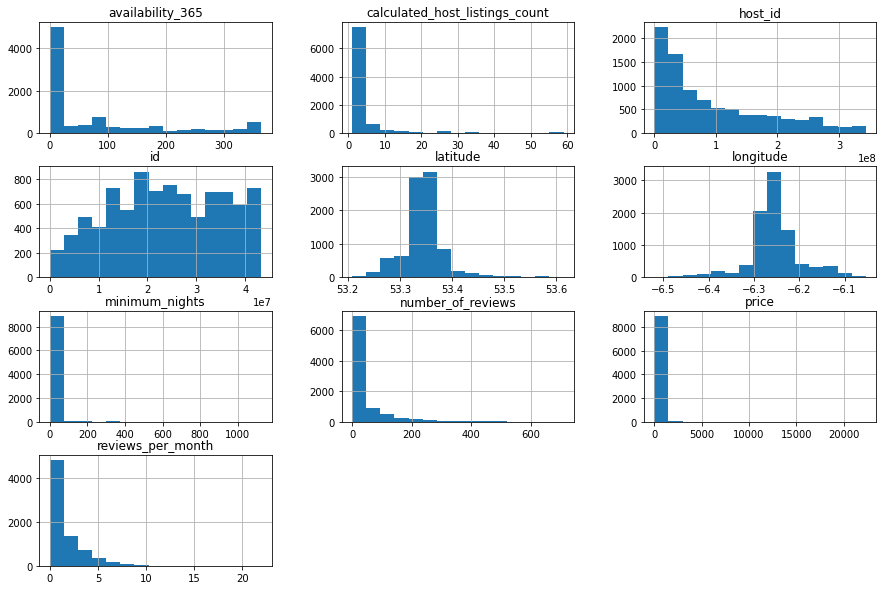

In [7]:
# plotar o histograma das variáveis numéricas
df_clean.hist(bins=15, figsize=(15,10));

In [8]:
# ver o resumo estatítico das variáveis numéricas
df_clean[["price", "latitude", "longitude", 'minimum_nights']].describe()

,price,latitude,longitude,minimum_nights
count,8961.000000,8961.000000,8961.000000,8961.000000
mean,137.972548,53.345717,-6.254619,4.485437
std,349.021742,0.043478,0.057335,21.873771
min,0.000000,53.208360,-6.519370,1.000000
25%,55.000000,53.330430,-6.277660,1.000000
50%,89.000000,53.344220,-6.259230,2.000000
75%,150.000000,53.357290,-6.235400,3.000000
max,22337.000000,53.614360,-6.053200,1125.000000


Com base na distribuição dos valores no histograma e no resumo estatístico, podemos observar que os valores mínimo, máximo e os quartis estão dentro do esperado para latitude e longitude. No entanto, observa-se valores iguais a zero para preço, bem como um valor máximo discrepante dos quartis para preço e número mínimo de noites.  Com auxílio de um gráfico boxplot, podemos, visualmente analisar a distribuição dos preços e do número mínimo de noites das acomodações.

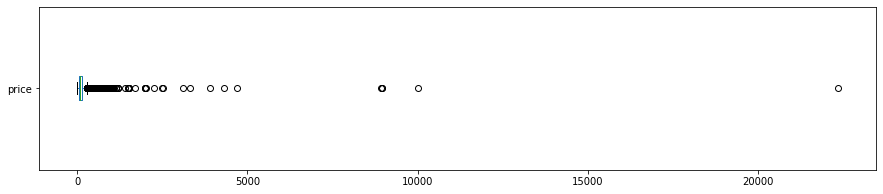

In [9]:
# price
df_clean.price.plot(kind="box", vert=False, figsize=(15,3))
plt.show()


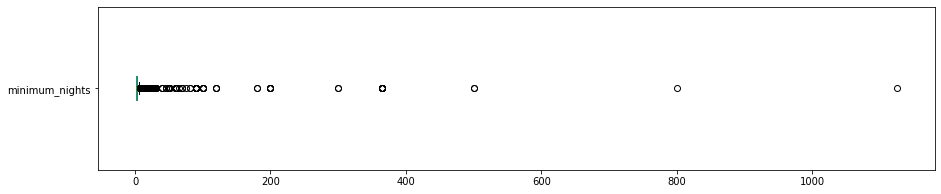

In [10]:
# minimum_nights
df_clean.minimum_nights.plot(kind="box", vert=False, figsize=(15,3))
plt.show()

Utilizando a regra 1.5 x IQR sobre o primeiro e o terceiro quartil, vamos obter os *outliers* dos preços e do número mínimo de noites.Verificando também a quantidade de outliers. Iniciando a verificação pelos preços das acomodações e, em seguida, os números mínimo de noites.

In [11]:
# price
q3, q1 = np.percentile(df_clean.price, [75, 25])
print(f'q3 = {q3} e q1 = {q1}')
iqr = q3 - q1
print(f'iqr = {iqr}')
low_outlier = q1 - 1.5*iqr
high_outlier = q3 + 1.5*iqr
print(f'low outlier = {low_outlier}\nhigh outlier = {high_outlier}')
print(f'Existem {len(df_clean[df_clean.price < low_outlier])} outliers abaixo de {low_outlier} (low outlier)')
print(f'Existem {len(df_clean[df_clean.price > high_outlier])} outliers acima de {high_outlier} (high outlier)')

q3 = 150.0 e q1 = 55.0
iqr = 95.0
low outlier = -87.5
high outlier = 292.5
Existem 0 outliers abaixo de -87.5 (low outlier)
Existem 715 outliers acima de 292.5 (high outlier)


Considerando que o estudo se refere a preços de acomodações, sugerimos a eliminação dos registros cujos dados de preços encontram acima de 1.000,00 e não aqueles acima de 292.50. Verificamos, então, a quantidade de registros cujo preços têm valores maiores que 1.000,00 e os eliminamos.

In [12]:
# verificando a quantidade de registros cujo preços têm valores maiores que 1.000,00
print("price: valores acima de 1000:")
print(f"{len(df_clean[df_clean.price > 1000])} registros")
print("{:.4f}%".format((len(df_clean[df_clean.price > 1000])/df_clean.shape[0])*100))

price: valores acima de 1000:
34 registros
0.3794%


In [0]:
# removendo registros
df_clean.drop(df_clean[df_clean.price > 1000].index, axis=0, inplace=True)

Agora verificamos os *outliers* do número mínimo de noites.

In [14]:
# minimum_nights
q3, q1 = np.percentile(df_clean.minimum_nights, [75, 25])
print(f'q3 = {q3} e q1 = {q1}')
iqr = q3 - q1
print(f'iqr = {iqr}')
low_outlier = q1 - 1.5*iqr
high_outlier = q3 + 1.5*iqr
print(f'low outlier = {low_outlier}\nhigh outlier = {high_outlier}')
print(f'Existem {len(df_clean[df_clean.minimum_nights < low_outlier])} outliers abaixo de {low_outlier} (low outlier)')
print(f'Existem {len(df_clean[df_clean.minimum_nights > high_outlier])} outliers acima de {high_outlier} (high outlier)')

q3 = 3.0 e q1 = 1.0
iqr = 2.0
low outlier = -2.0
high outlier = 6.0
Existem 0 outliers abaixo de -2.0 (low outlier)
Existem 997 outliers acima de 6.0 (high outlier)


Considerando que a verificação se refere ao número mínimo de noites nas acomodações, sugerimos a eliminação dos registros cujos dados se encontram acima de 30 noites e não aqueles acima de 6. Verificamos, então, a quantidade de registros cujo valores maiores que 30 e os eliminamos.


In [15]:
# verificando a quantidade de registros com minimum_nights com valores maiores que 30
print("minimum_nights: valores acima de 30:")
print(f"{len(df_clean[df_clean.minimum_nights > 30])} registros")
print("{:.4f}%".format((len(df_clean[df_clean.minimum_nights > 30])/df_clean.shape[0])*100))

minimum_nights: valores acima de 30:
76 registros
0.8513%


In [0]:
# removendo os registros
df_clean.drop(df_clean[df_clean.minimum_nights > 30].index, axis=0, inplace=True)

Após eliminarmos os *outliers* de preços e de número mínimo de noites, vamos observar novamente o resumo estatístico.

In [17]:
df_clean[["price", "latitude", "longitude", 'minimum_nights']].describe()

,price,latitude,longitude,minimum_nights
count,8851.000000,8851.000000,8851.000000,8851.000000
mean,125.160321,53.345714,-6.254585,3.205739
std,125.791878,0.043616,0.057468,4.161654
min,0.000000,53.208360,-6.519370,1.000000
25%,55.000000,53.330415,-6.277700,1.000000
50%,89.000000,53.344210,-6.259200,2.000000
75%,150.000000,53.357255,-6.235375,3.000000
max,1000.000000,53.614360,-6.053200,30.000000


A exceção de valor mínimo de preço igual a zero, os demais valores estão dentro da faixa esperada. Vamos verificar a quantidade de registros com preço igual a zero.

In [18]:
# verificando a quantidade de acomodações com preço igual a zero
print("price: valores iguais a zero:")
print(f"{len(df_clean[df_clean.price == 0])} entradas")
print("{:.4f}%".format((len(df_clean[df_clean.price == 0])/df_clean.shape[0])*100))

price: valores iguais a zero:
1 entradas
0.0113%


Observamos que existe apenas um registro cujo preço é igual a zero. Temos duas opções de tratamento desta unidade: eliminá-la ou considerar o seu preço como a média do valor dos demais preços. Optamos pela segunda.

In [0]:
# alterando o valor de zero para a média de preços (não incluindo o zero no cálculo)
nonzero_mean = df_clean[ df_clean.price != 0 ].mean()
df_clean.loc[ df_clean.price == 0, "price" ] = nonzero_mean

Vamos observar novamente o resumo estatístico para conferir o valor mínimo de preço e visualizar as mudanças no histograma.

In [20]:
df_clean[["price", "latitude", "longitude", 'minimum_nights']].describe()

,price,latitude,longitude,minimum_nights
count,8850.000000,8851.000000,8851.000000,8851.000000
mean,125.174463,53.345714,-6.254585,3.205739
std,125.791948,0.043616,0.057468,4.161654
min,9.000000,53.208360,-6.519370,1.000000
25%,55.000000,53.330415,-6.277700,1.000000
50%,89.000000,53.344210,-6.259200,2.000000
75%,150.000000,53.357255,-6.235375,3.000000
max,1000.000000,53.614360,-6.053200,30.000000


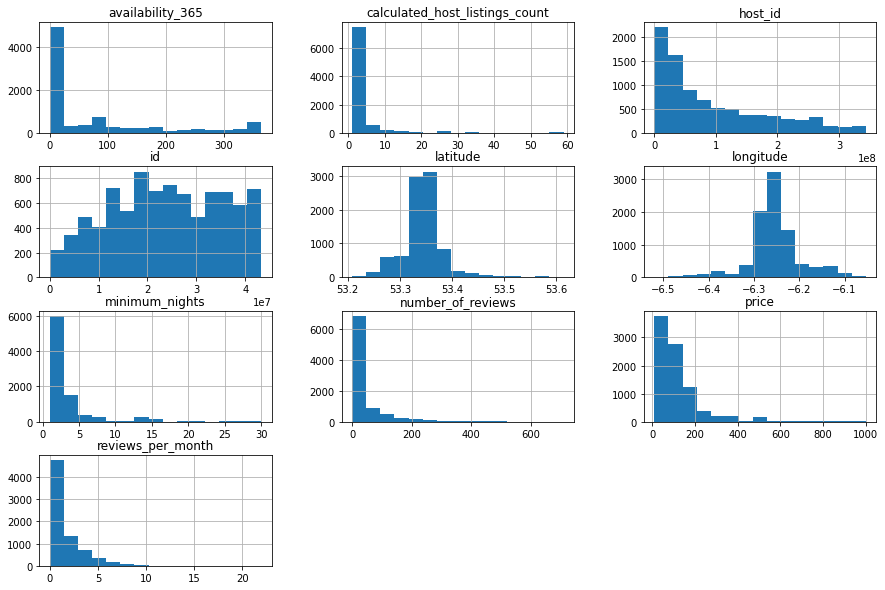

In [21]:
# plotar o histograma para as variáveis numéricas
df_clean.hist(bins=15, figsize=(15, 10));

Não tem muita mudança visual nos histogramas de preço e número mínimo de noites porque consideramos valores maiores de *outliers* do que o calculado.

Uma informação importante é conhecer a correlação entre os atributos. Correlação significa que existe uma relação entre duas coisas. No nosso contexto, estamos buscando relação ou semelhança entre duas variáveis.
Essa relação pode ser medida. É função do coeficiente de correlação estabelecer qual a intensidade dela. Para identificar as correlações existentes entre as variáveis de interesse, vamos:
* Criar uma matriz de correlação
* Gerar um mapa de calor a partir dessa matriz, usando a biblioteca *seaborn*

In [22]:
# criar uma matriz de correlação
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365']].corr()

display(corr)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
price,1.000000,0.033727,-0.058651,-0.033912,0.149285,0.120494
minimum_nights,0.033727,1.000000,-0.050282,-0.070364,0.097163,0.063502
number_of_reviews,-0.058651,-0.050282,1.000000,0.779329,-0.001023,0.172058
reviews_per_month,-0.033912,-0.070364,0.779329,1.000000,0.061169,0.184124
calculated_host_listings_count,0.149285,0.097163,-0.001023,0.061169,1.000000,0.177890
availability_365,0.120494,0.063502,0.172058,0.184124,0.177890,1.000000


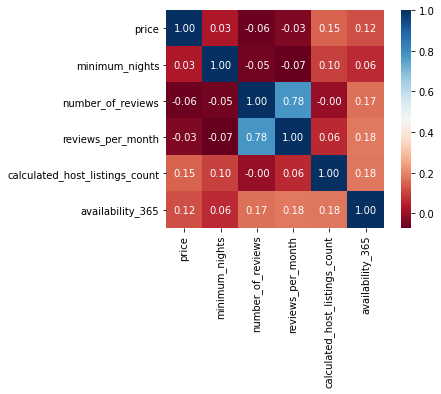

In [23]:
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

No mapa de calor não tem informação relevante. Percebe-se que a quantidade de avaliações tem uma relação alta com a quantidade de avaliações por mês. Essa não é uma informação relevante. <br>
Agora temos os dados prontos para extrair algumas informações dos dados já processados e explorados.

## **Informações Obtidas a Partir do Dados**
Algumas informações obtidas a partir dos dados podem ser:
* quantidade de acomodações por bairro; 
* quantidade de tipos de acomodações; 
* a média de preços dos tipos de acomodações por bairros; e
* a distribuição geográfica das acomodações, com seus tipos e preços.

In [24]:
# Total de acomodações
df_clean.shape[0]

8851

In [25]:
# mostrar a quantidade de acomodações por bairro
df_clean.neighbourhood.value_counts()

Dublin City              6791
Dn Laoghaire-Rathdown     951
Fingal                    773
South Dublin              336
Name: neighbourhood, dtype: int64

In [26]:
# mostrar a quantidade de acomodações em termos percentuais
df_clean.neighbourhood.value_counts()*100/df_clean.shape[0]

Dublin City              76.725794
Dn Laoghaire-Rathdown    10.744549
Fingal                    8.733476
South Dublin              3.796181
Name: neighbourhood, dtype: float64

Obtemos que, aproximadamente, 77% das acomodações estão localizadas em Dublin City, correspondendo a um total de 6.868 acomodações de um total de 8.851 acomodações.

In [27]:
# mostrar a quantidade de cada tipo de unidade disponível
df_clean.room_type.value_counts()

Entire home/apt    4377
Private room       4245
Shared room         145
Hotel room           84
Name: room_type, dtype: int64

In [28]:
# mostrar a porcentagem de cada tipo de imóvel disponível
df_clean.room_type.value_counts()*100/df_clean.shape[0]

Entire home/apt    49.452039
Private room       47.960682
Shared room         1.638233
Hotel room          0.949045
Name: room_type, dtype: float64

As acomodações do tipo apartamento ou casa inteira correspondem a aproximadamente 49% das acomodações existentes, muito próximo dos cerca de 48% de quartos privados. Apesar de existirem quartos compartilhados e quartos de hotéis, estes são em número bem reduzido em relação aos outros tipos.

In [29]:
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=False)

neighbourhood
Dublin City              132.743190
Dn Laoghaire-Rathdown    115.945321
Fingal                    89.981865
South Dublin              79.181548
Name: price, dtype: float64

In [30]:
df_clean.groupby(['neighbourhood','room_type'])['price'].mean()

neighbourhood          room_type      
Dn Laoghaire-Rathdown  Entire home/apt    163.549266
                       Private room        68.335484
                       Shared room         52.777778
Dublin City            Entire home/apt    176.139555
                       Hotel room         267.172840
                       Private room        81.927608
                       Shared room         48.975806
Fingal                 Entire home/apt    151.007576
                       Hotel room          86.666667
                       Private room        57.740964
                       Shared room         83.571429
South Dublin           Entire home/apt    141.764045
                       Private room        56.516529
                       Shared room         62.200000
Name: price, dtype: float64

<p>A média de preços de acomodações é maior em Dublin City e o preço de acomodação do tipo quarto de hotel tem preço médio maior do que os outros tipos somente em Dublin City</p>
<p>A concentração geografica das acomodações existentes pode ser observada com o uso das bilbliotecas importadas para o ambiente. Na primeira visualização, a biblioteca gera uma visualização estática. A segunda visualização permite uma interação maior com o mapa e suas informações, possibilitando ver não só a concentração das acomodações, como seu valor e tipo, bem como realizar zoom no mapa.</p> 

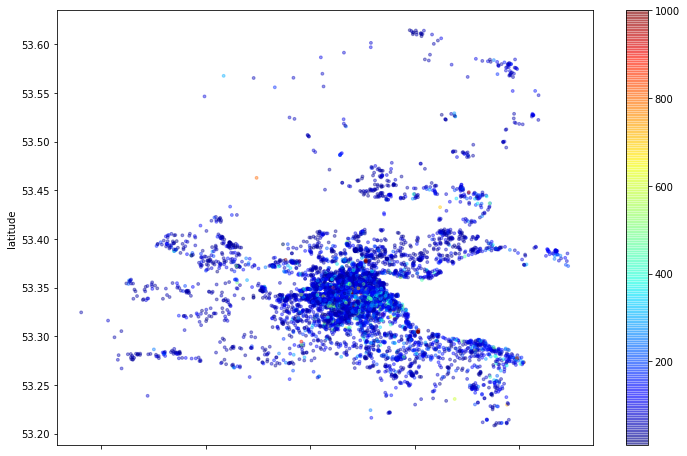

In [31]:
# plotar os imóveis pela posição geográfica
df_clean.plot(kind='scatter', x='longitude', y='latitude', alpha=0.4, c=df_clean['price'], s=8, cmap=plt.get_cmap('jet'), figsize=(12,8));

In [32]:
# plotar os imóveis no mapa da Irlanda
mapa = folium.Map(
    #location=[53.342331, -6.231945],
    location=[df_clean['latitude'].mean(), df_clean['longitude'].mean()],
    tiles='OpenStreetMap',
    zoom_start=11
)
marker_cluster = MarkerCluster().add_to(mapa)

for _, airbnb in df_clean.iterrows():
  #definindo as cores dos marcadores em função do valor do airbnb (até 50 - green, até 150 - orange  e mais que 150 - red )
  if airbnb['price'] <= 50:
    color = 'green'
  elif 50 < airbnb['price'] <= 150:
    color = 'orange'
  else:
    color = 'red'

  folium.Marker(
      location=[airbnb['latitude'], airbnb['longitude']],
      popup="<center>{}</center><br><center>{:.2f}</center>".format(airbnb['room_type'], airbnb['price']),
      icon=folium.Icon(color=color)
  ).add_to(marker_cluster)

mapa.save('/content/irlanda_airbnb.html')

mapa

## **Conclusão**
 Apesar de ser um estudo incipiente sobre o tema e após verificar e tratar os dados, podemos concluir que há maior concentração das acomodações do Airbnb em Dublin City, bem como a média mais elevada de preço. Observamos também que somente em Dublin City as acomodações do tipo quarto de hotel possuem média de preço maior do que o tipo apartamento ou casa inteira. Essas informações auxiliam na escolha da acomodação do Airbnb dentro do orçamento disponível. No que tange à visualização, um mapa interativo acrescenta muito à observação das acomodações. No entanto, esta funcionalidade pode não ser possível utilizar, dependendo do repositório em que este artigo se encontra. <br>

## **Referências**
* Canal do YouTube Mineirando Dados. Plotando Mapas Interativos com Python (Visualize Dados de Vendas por Região). 2019. Disponível em: <https://youtu.be/EElW-W0GmrA>. Acesso em: 08 jun. 2020.

* Carlos Melo. Sigmoidal. Dispinível em: <https://sigmoidal.ai/>. Acesso em: 01 jun. 2020.

* Elipse Knowledgebase. Removendo dados discrepantes (outliers) com a linguagem Python. Disponível em: <https://kb.elipse.com.br/removendo-dados-discrepantes-outliers-com-a-linguagem-python/>. Acesso em: 12 jun. 2020.

* Filipe Garrett. O que é AirBnb?. Disponível em: <https://www.techtudo.com.br/dicas-e-tutoriais/noticia/2017/01/o-que-e-airbnb.html>. Acesso em: 12 jun. 2020.

* Inside Airbnb. Get the Data. Disponível em: <http://insideairbnb.com/get-the-data.html>. Acesso em: 07 jun. 2020.

* Jessica Temporal. Colocando Pontos num Mapa com Folium. 2017. Disponível em: <https://jtemporal.com/folium/>. Acesso em: 08 jun. 2020.

* Kan Achademy. Identifying outliers with the 1.5xIQR rule. Disponível em:<https://www.khanacademy.org/math/statistics-probability/summarizing-quantitative-data/box-whisker-plots/a/identifying-outliers-iqr-rule>. Acesso em: 10 jun. 2020.

* Larissa Borges. Referência de Site ABNT: veja como fazer com exemplos para não errar mais!. 2018. Disponível em: <https://comunidade.rockcontent.com/como-fazer-referencia-de-site/>. Acesso em: 09 jun. 2020.

* Lucas Ximenes. Python e a Ciência de Dados. 2020. Disponível em: <https://abracd.org/python-e-a-ciencia-de-dados/>. Acesso em: 07 jun. 2020.

* Matplotlib. Disponível em: <https://matplotlib.org/>. Acesso em: 08 jun. 2020.

* Mercer. Mercer’s 25th Annual Cost of Living Survey Finds Cities in Asia Most Expensive Locations for Expatriates. Disponível em: <https://www.mercer.ie/newsroom/mercers-25th-annual-cost-of-living-survey-finds-cities-in-asia-most-expensive-locations-for-employees-working-abroad.html>. Acesso em: 12 jun. 2020.

* Nicholas Leong. Python for Data Science- A Guide to Pandas. 2019. Disponível em: <https://towardsdatascience.com/python-for-data-science-basics-of-pandas-5f8d9680617e>. Acesso em: 07 jun. 2020.

* Paulo Vasconcelos. O que é Data Storytelling? Disponível em: <https://paulovasconcellos.com.br/o-que-%C3%A9-data-storytelling-ac5a924dcdaf>. Acesso  em: 12 jun. 2020.

* Portal da Educação. Referências Bibliográficas Tiradas na Internet: Como Colocar no Trabalho?. Disponível em: <https://siteantigo.portaleducacao.com.br/conteudo/artigos/nutricao/referencias-bibliograficas-tiradas-na-internet-como-colocar-no-trabalho/48764>. Acesso em: 09 jun. 2020.

* Python-visualization/folium. Disponível em: <https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/MarkerCluster.ipynb>. Acesso em 08 jun. 2020.

* Seaborn: Statistical Data Visualization. Disponível em: <https://seaborn.pydata.org/>. Acesso em: 08 jun. 2020.

* Serdar Yegulalp. Python: principal caso de uso é para ciência de dados, mostra estudo. 2019. Disponível em: <https://computerworld.com.br/2019/02/08/python-principal-caso-de-uso-e-para-ciencia-de-dados-mostra-estudo/>. Acesso em: 07 jun. 2020.
